In [2]:
# 라이브러리 호출

%matplotlib inline
import glob
import json
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from pathlib import Path
from PIL import Image
from collections import Counter
import numpy as np
import os

In [3]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

In [12]:
DATA_PATH = '/data/ephemeral/home/data'
LANGUAGES = ['chinese', 'japanese', 'thai', 'vietnamese']
LANGUAGE_CODES = {
    'chinese': 'zh',
    'japanese': 'ja',
    'thai': 'th',
    'vietnamese': 'vi'
}

In [4]:
def read_json(filename):
    print(f"Reading file: {filename}")
    with open(filename, 'r', encoding='utf8') as handle:
        data = json.load(handle)
        # 'images' 키 아래의 데이터를 반환
        return data['images']

In [5]:
def get_box_size(quads):
    """ 단어 영역의 사각형 좌표가 주어졌을 때 가로, 세로길이를 계산해주는 함수.
    Args:
        quads: np.ndarray(n, 4, 2) n개 단어 bounding-box의 4개 점 좌표 (단위 pixel)
    Return:
        sizes: np.ndarray(n, 2) n개 box의 (height, width)쌍
    """
    dists = []
    for i, j in [(1, 2), (3, 0), (0, 1), (2, 3)]: # [right(height), left(height), upper(width), lower(width)] sides
        dists.append(np.linalg.norm(quads[:, i] - quads[:, j], ord=2, axis=1))

    dists = np.stack(dists, axis=-1).reshape(-1, 2, 2) # shape (n, 2, 2) heights, widths into separate dim
    return np.rint(dists.mean(axis=-1)).astype(int)

In [13]:
def get_language_from_filename(filename):
    """파일명에서 언어 코드를 추출하고 전체 언어명으로 변환"""
    code = filename.split('.')[1]
    for lang, lang_code in LANGUAGE_CODES.items():
        if code == lang_code:
            return lang
    return code

In [35]:
def plot_bbox_examples(image_key, lang, data):
    """특정 이미지의 bounding box를 시각화"""
    image_path = os.path.join(DATA_PATH, f'{lang}_receipt/img/train/{image_key}')
    try:
        # 이미지 로드 및 방향 보정
        image = Image.open(image_path)
        try:
            exif = image._getexif()
            if exif:
                orientation = exif.get(274)  # 274는 Orientation 태그
                if orientation == 3:
                    image = image.rotate(180, expand=True)
                elif orientation == 6:
                    image = image.rotate(270, expand=True)
                elif orientation == 8:
                    image = image.rotate(90, expand=True)
        except (AttributeError, KeyError, IndexError):
            pass
        
        width = data[image_key]['img_w']
        height = data[image_key]['img_h']
        
        fig, ax = plt.subplots(figsize=(height/100, width/100))
        ax.imshow(image)
        
        word_ann = data[image_key]['words']
        colors = plt.cm.rainbow(np.linspace(0, 1, len(word_ann)))
        
        # 이미지 회전에 따른 좌표 변환이 필요한 경우 추가
        for (word_id, word), color in zip(word_ann.items(), colors):
            points = np.array(word['points'])
            points = np.append(points, [points[0]], axis=0)
            
            ax.plot(points[:, 0], points[:, 1], '-', color=color, linewidth=1, alpha=0.7)
            
            center = points.mean(axis=0)
            y_min = min(points[:, 1])
            
            ax.text(center[0], y_min - 10,
                   f'{word_id}',
                   color=color,
                   fontsize=6,
                   ha='center',
                   va='bottom',
                   bbox=dict(facecolor='white', alpha=0.7, edgecolor='none', pad=0.2))
        
        plt.title(f'Bounding Boxes - {lang}\n{image_key}', pad=20)
        plt.axis('scaled')
        plt.grid(True, alpha=0.3)
        plt.show()
        
        print(f"\nImage Info - {image_key}")
        print(f"Number of words: {len(word_ann)}")
        print(f"Image size: {width} x {height}")
        
    except Exception as e:
        print(f"Error displaying image {image_key}: {e}")

In [16]:
# 데이터 파일 경로 설정
path_lists = []
for lang in LANGUAGES:
    path = os.path.join(DATA_PATH, f"{lang}_receipt/ufo/train.json")
    if os.path.exists(path):
        path_lists.append(path)
    else:
        print(f"Warning: Path does not exist - {path}")

print("\nFound JSON files:")
for path in path_lists:
    print(f"- {path}")


Found JSON files:
- /data/ephemeral/home/data/chinese_receipt/ufo/train.json
- /data/ephemeral/home/data/japanese_receipt/ufo/train.json
- /data/ephemeral/home/data/thai_receipt/ufo/train.json
- /data/ephemeral/home/data/vietnamese_receipt/ufo/train.json


In [17]:
# JSON 파일들을 읽어서 하나로 합치기
data = {}
for path in path_lists:
    try:
        json_data = read_json(path)
        selected_items = dict(list(json_data.items())[:100])
        data.update(selected_items)
        print(f"Added {len(selected_items)} items from {path}")
    except Exception as e:
        print(f"Error processing {path}: {e}")

print(f"\nTotal number of images loaded: {len(data)}")

Reading file: /data/ephemeral/home/data/chinese_receipt/ufo/train.json
Added 100 items from /data/ephemeral/home/data/chinese_receipt/ufo/train.json
Reading file: /data/ephemeral/home/data/japanese_receipt/ufo/train.json
Added 100 items from /data/ephemeral/home/data/japanese_receipt/ufo/train.json
Reading file: /data/ephemeral/home/data/thai_receipt/ufo/train.json
Added 100 items from /data/ephemeral/home/data/thai_receipt/ufo/train.json
Reading file: /data/ephemeral/home/data/vietnamese_receipt/ufo/train.json
Added 100 items from /data/ephemeral/home/data/vietnamese_receipt/ufo/train.json

Total number of images loaded: 400


In [18]:
# 데이터 구조화
df = {
    'image': [],
    'word_counts': [],
    'image_width': [],
    'image_height': [],
    'language': []
}

bbox_sizes = []
points_data = []
aspect_ratios = []

In [19]:
for image_key, image_value in data.items():
    df['image'].append(image_key)
    df['image_width'].append(image_value['img_w'])
    df['image_height'].append(image_value['img_h'])
    df['language'].append(get_language_from_filename(image_key))
    
    word_ann = image_value['words']
    df['word_counts'].append(len(word_ann))
    
    for word in word_ann.values():
        try:
            points = np.array(word['points'])
            points_data.append(points)
            
            x_coords = points[:, 0]
            y_coords = points[:, 1]
            width = max(x_coords) - min(x_coords)
            height = max(y_coords) - min(y_coords)
            bbox_sizes.append(width * height)
            aspect_ratios.append(width / height if height != 0 else 0)
            
        except Exception as e:
            print(f"Error processing word in {image_key}: {e}")

In [21]:
image_df = pd.DataFrame.from_dict(df)
image_df

,image,word_counts,image_width,image_height,language
0,extractor.zh.in_house.appen_000692_page0001.jpg,34,1280,1707,chinese
1,extractor.zh.in_house.appen_000835_page0001.jpg,49,1280,1707,chinese
2,extractor.zh.in_house.appen_000849_page0001.jpg,37,678,1240,chinese
3,extractor.zh.in_house.appen_000389_page0001.jpg,52,3024,4032,chinese
4,extractor.zh.in_house.appen_000333_page0001.jpg,197,1418,2127,chinese
...,...,...,...,...,...
395,extractor.vi.in_house.appen_000433_page0001.jpg,65,2333,3324,vietnamese
396,extractor.vi.in_house.appen_000380_page0001.jpg,75,452,675,vietnamese
397,extractor.vi.in_house.appen_000051_page0001.jpg,117,720,960,vietnamese
398,extractor.vi.in_house.appen_000100_page0001.jpg,189,1733,3975,vietnamese


/tmp/ipykernel_382441/1060855849.py:2: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn')


<Figure size 1500x1500 with 0 Axes>

Text(0.5, 1.02, 'Image Size Distribution by Language')

<Axes: xlabel='image_width', ylabel='image_height'>

Text(0.5, 1.0, 'Chinese')

Text(0.5, 0, 'Width')

Text(0, 0.5, 'Height')

<Axes: xlabel='image_width', ylabel='image_height'>

Text(0.5, 1.0, 'Japanese')

Text(0.5, 0, 'Width')

Text(0, 0.5, 'Height')

<Axes: xlabel='image_width', ylabel='image_height'>

Text(0.5, 1.0, 'Thai')

Text(0.5, 0, 'Width')

Text(0, 0.5, 'Height')

<Axes: xlabel='image_width', ylabel='image_height'>

Text(0.5, 1.0, 'Vietnamese')

Text(0.5, 0, 'Width')

Text(0, 0.5, 'Height')

<Figure size 1500x1500 with 0 Axes>

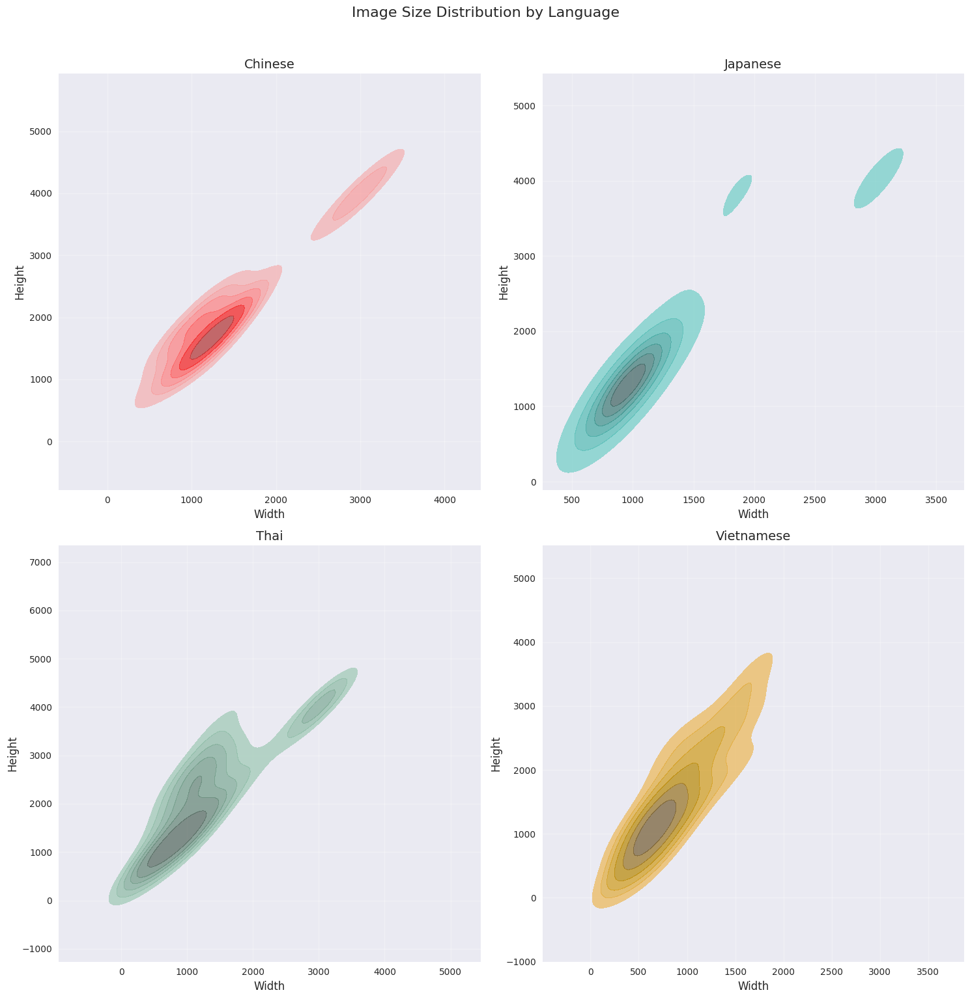

In [51]:
# 각 시각화를 위한 figure 생성
plt.style.use('seaborn')

# 1. 이미지 크기 분포 - KDE plot
plt.figure(figsize=(15, 15))
fig, axes = plt.subplots(2, 2, figsize=(15, 15))
fig.suptitle('Image Size Distribution by Language', fontsize=16, y=1.02)

colors = {
   'chinese': '#FF6B6B',    # 빨간색
   'japanese': '#4ECDC4',   # 청록색
   'thai': '#96CEB4',       # 초록색
   'vietnamese': '#FFBE0B'  # 노란색
}

for (i, lang), ax in zip(enumerate(colors.keys()), axes.flat):
   subset = image_df[image_df['language'] == lang]
   sns.kdeplot(data=subset, 
               x='image_width', 
               y='image_height',
               fill=True, 
               alpha=0.7, 
               color=colors[lang],
               levels=7, 
               thresh=.2, 
               ax=ax)
   ax.set_title(f'{lang.capitalize()}', fontsize=14)
   ax.set_xlabel('Width', fontsize=12)
   ax.set_ylabel('Height', fontsize=12)
   ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

<Figure size 1200x800 with 0 Axes>

/tmp/ipykernel_382441/862205189.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=image_df, x='language', y='word_counts',


<Axes: xlabel='language', ylabel='word_counts'>

Text(0.5, 1.0, 'Words per Image Distribution by Language')

Text(0.5, 0, 'Language')

Text(0, 0.5, 'Number of Words')

([0, 1, 2, 3],
 [Text(0, 0, 'chinese'),
  Text(1, 0, 'japanese'),
  Text(2, 0, 'thai'),
  Text(3, 0, 'vietnamese')])

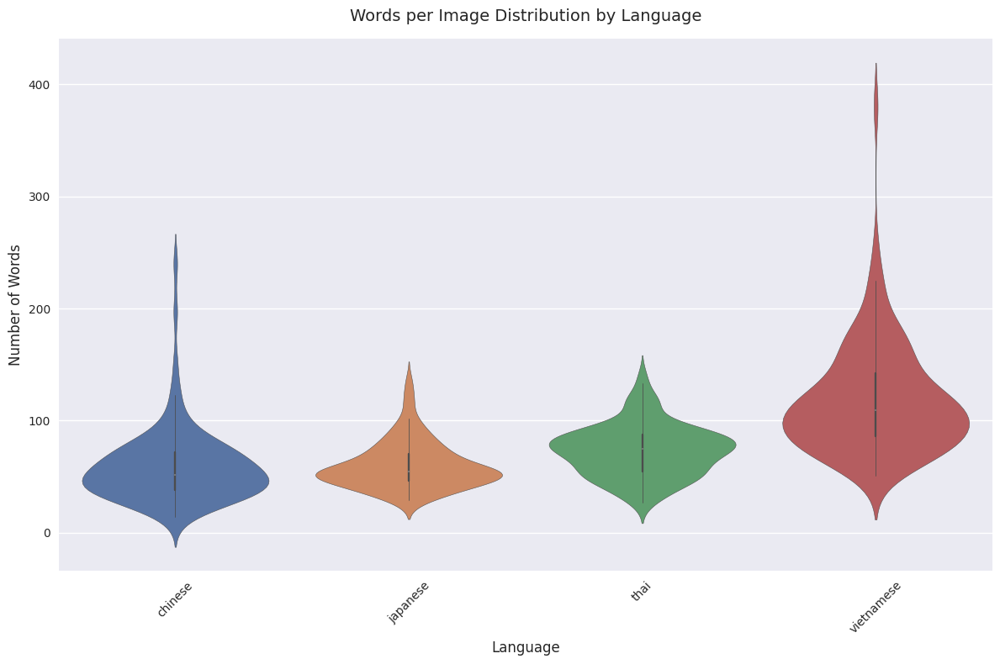

In [53]:
# 2. 단어 개수 분포 
plt.figure(figsize=(12, 8))
sns.violinplot(data=image_df, x='language', y='word_counts', 
              inner='box', 
              palette='deep')
plt.title('Words per Image Distribution by Language', fontsize=14, pad=15)
plt.xlabel('Language', fontsize=12)
plt.ylabel('Number of Words', fontsize=12)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

<Figure size 1200x800 with 0 Axes>

<Axes: xlabel='Box Size', ylabel='Count'>

Text(0.5, 1.0, 'Bounding Box Size Distribution (Log Scale)')

Text(0.5, 0, 'Box Size (pixels)')

Text(0, 0.5, 'Count (log)')

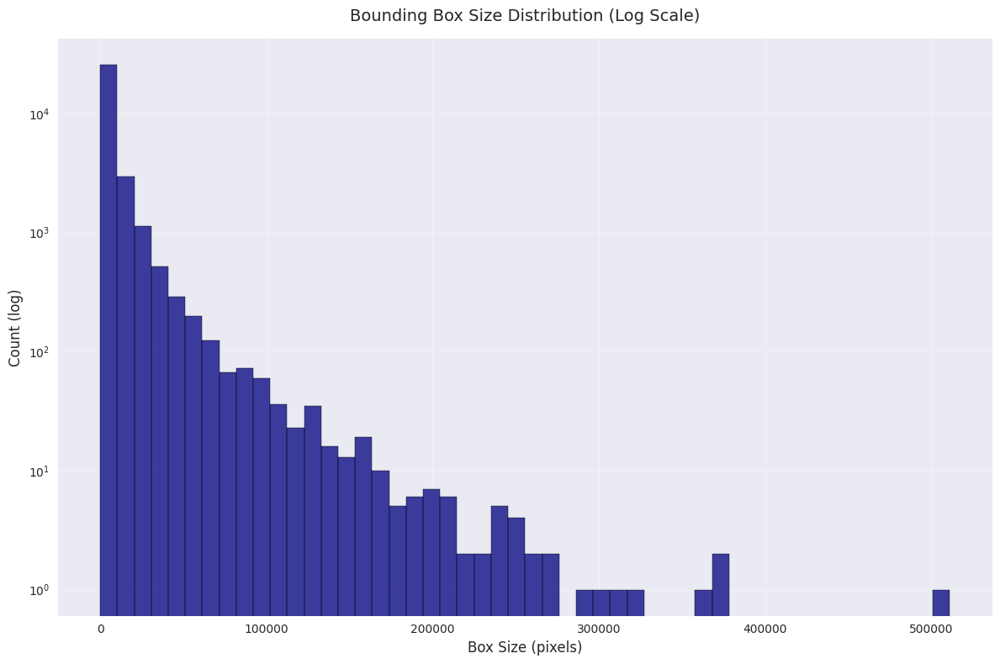

In [54]:
# 3. Bounding box 크기 분포
plt.figure(figsize=(12, 8))
sns.histplot(data=pd.DataFrame({'Box Size': bbox_sizes}), 
           x='Box Size', bins=50, 
           color='navy',
           log=True)
plt.title('Bounding Box Size Distribution (Log Scale)', fontsize=14, pad=15)
plt.xlabel('Box Size (pixels)', fontsize=12)
plt.ylabel('Count (log)', fontsize=12)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

<Figure size 1200x800 with 0 Axes>

<Axes: xlabel='Aspect Ratio', ylabel='Count'>

Text(0.5, 1.0, 'Word Aspect Ratio Distribution (Log Scale)')

Text(0.5, 0, 'Aspect Ratio (width/height)')

Text(0, 0.5, 'Count (log)')

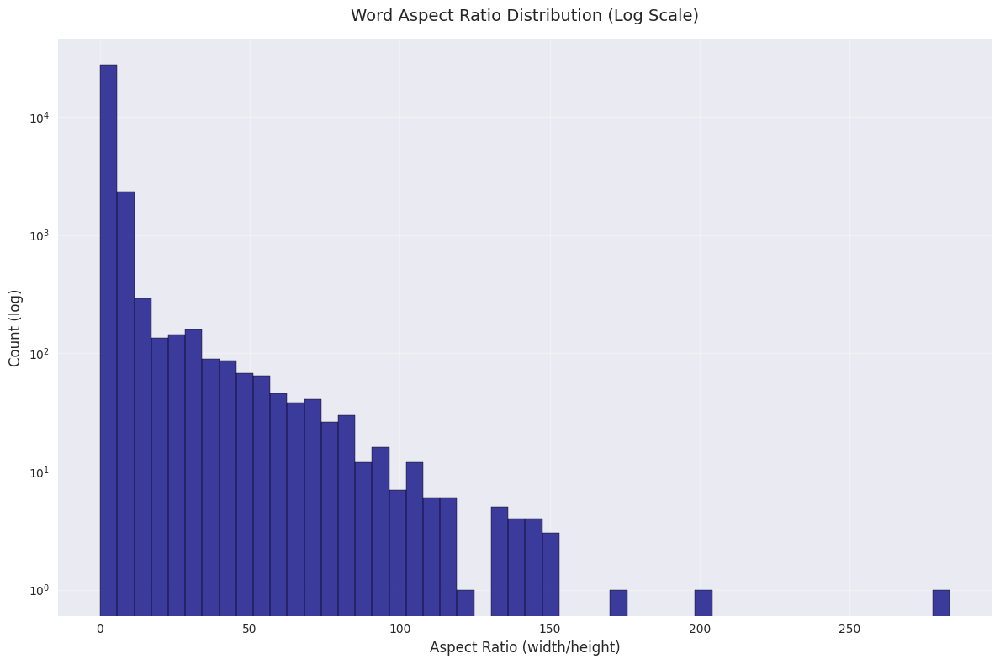

In [55]:
# 4. Aspect Ratio 분포
plt.figure(figsize=(12, 8))
sns.histplot(data=pd.DataFrame({'Aspect Ratio': aspect_ratios}),
           x='Aspect Ratio', bins=50, 
           color='navy',
           log=True)
plt.title('Word Aspect Ratio Distribution (Log Scale)', fontsize=14, pad=15)
plt.xlabel('Aspect Ratio (width/height)', fontsize=12)
plt.ylabel('Count (log)', fontsize=12)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()


Showing example for chinese receipt


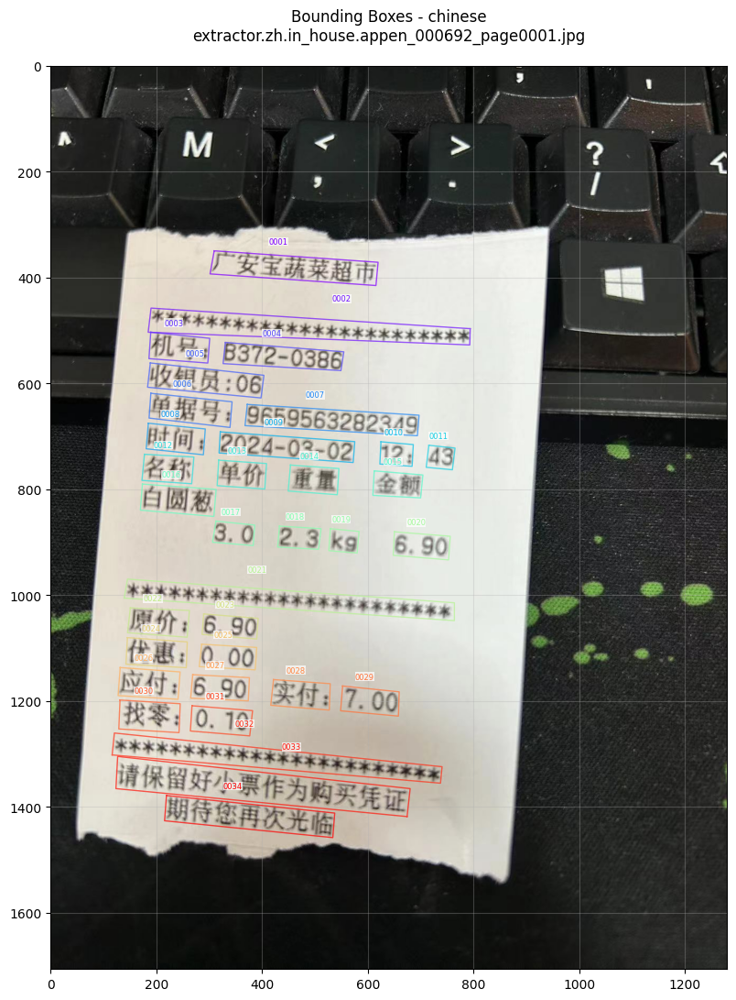


Image Info - extractor.zh.in_house.appen_000692_page0001.jpg
Number of words: 34
Image size: 1280 x 1707

Showing example for japanese receipt


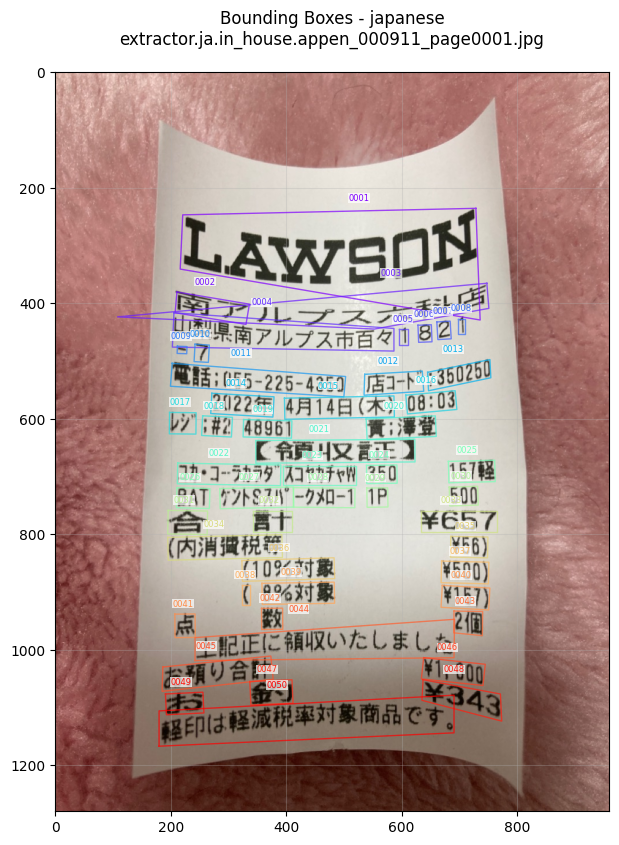


Image Info - extractor.ja.in_house.appen_000911_page0001.jpg
Number of words: 50
Image size: 960 x 1280

Showing example for thai receipt


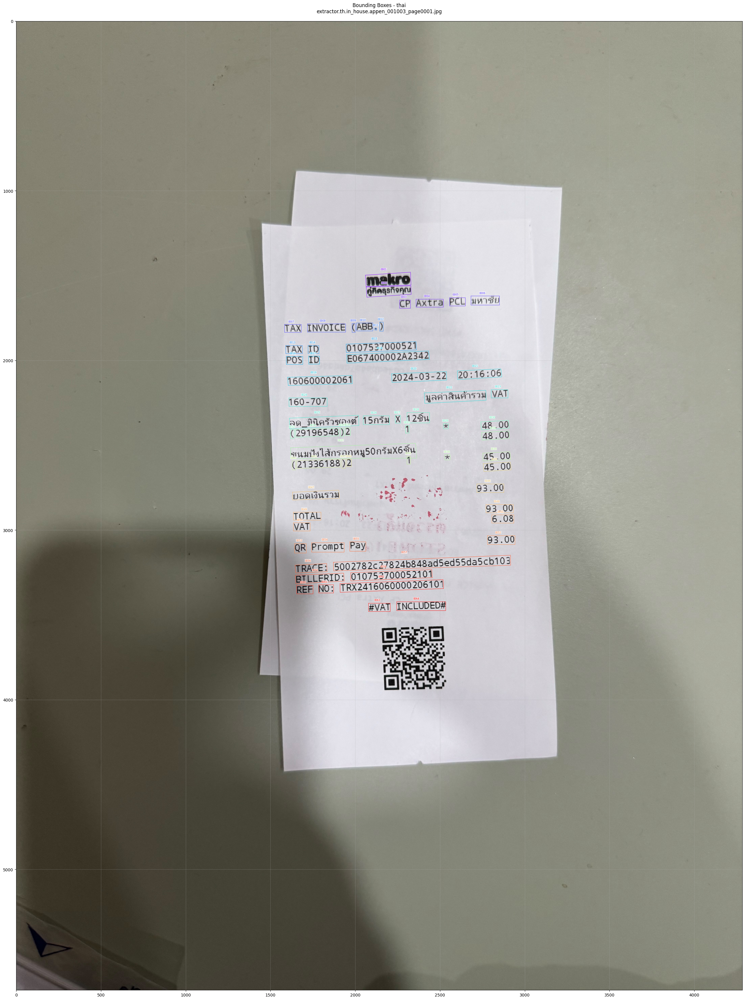


Image Info - extractor.th.in_house.appen_001003_page0001.jpg
Number of words: 64
Image size: 4284 x 5712

Showing example for vietnamese receipt


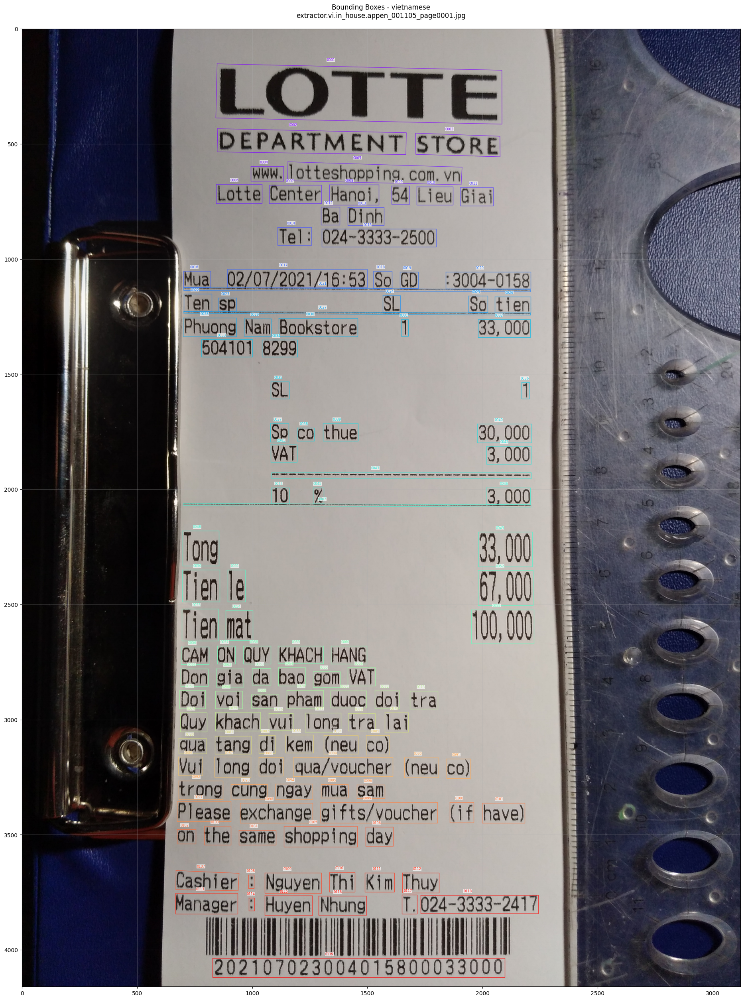


Image Info - extractor.vi.in_house.appen_001105_page0001.jpg
Number of words: 119
Image size: 3120 x 4160


In [36]:
# 각 언어별 예시 이미지 표시
for lang in LANGUAGES:
    print(f"\n{'='*50}")
    print(f"Showing example for {lang} receipt")
    print('='*50)
    
    lang_code = LANGUAGE_CODES[lang]
    for image_key in data.keys():
        if f'.{lang_code}.' in image_key:
            plot_bbox_examples(image_key, lang, data)
            break

In [24]:
# 데이터셋 통계 출력
print("\nDataset Summary:")
print(f"Total images: {len(image_df)}")
print("\nLanguage distribution:")
lang_dist = image_df['language'].value_counts()
print(lang_dist)
print("\nPercentage by language:")
print((lang_dist / len(image_df) * 100).round(2).astype(str) + '%')


Dataset Summary:
Total images: 400

Language distribution:
language
chinese       100
japanese      100
thai          100
vietnamese    100
Name: count, dtype: int64

Percentage by language:
language
chinese       25.0%
japanese      25.0%
thai          25.0%
vietnamese    25.0%
Name: count, dtype: object


In [25]:
print("\nImage size statistics by language:")
print(image_df.groupby('language')[['image_width', 'image_height']].describe())

print("\nWords per image statistics by language:")
print(image_df.groupby('language')['word_counts'].describe())


Image size statistics by language:
           image_width                                                        \
                 count     mean         std    min      25%     50%      75%   
language                                                                       
chinese          100.0  1477.63  696.659180  392.0  1080.00  1280.0  1423.50   
japanese         100.0  1162.37  505.820738  960.0   960.00   960.0   960.00   
thai             100.0  1345.48  840.668030  219.0   821.25  1108.0  1563.50   
vietnamese       100.0   983.03  540.522539  254.0   632.00   782.0  1283.25   

                   image_height                                         \
               max        count     mean          std     min      25%   
language                                                                 
chinese     3456.0        100.0  2157.53   946.063086   535.0  1706.00   
japanese    3024.0        100.0  1766.21   997.977898  1280.0  1280.00   
thai        4284.0        100.0  

In [26]:
print("\nBounding box size statistics:")
bbox_df = pd.DataFrame({'size': bbox_sizes})
print(bbox_df.describe())

print("\nAspect ratio statistics:")
aspect_df = pd.DataFrame({'ratio': aspect_ratios})
print(aspect_df.describe())


Bounding box size statistics:
                size
count   31162.000000
mean     7678.098783
std     17335.933230
min         6.821132
25%       976.376614
50%      2538.169890
75%      7151.262107
max    511254.223384

Aspect ratio statistics:
              ratio
count  31162.000000
mean       4.230286
std        9.328313
min        0.122522
25%        1.554701
50%        2.307187
75%        3.608656
max      283.436859
